<a href="https://colab.research.google.com/github/drkaushiksarkar/LendingClubCaseStudy/blob/master/Kaushik_Sarkar.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **UNDERSTANDING DRIVING FACTORS BEHIND LOAN DEFAULT**

**Objective:** EDA to understand how consumer attributes and loan attributes influence the tendency of default.

# 1. Import libraries and set environment

In [1]:
!python --version

Python 3.7.12


In [2]:
#stop warnings
import warnings
warnings.filterwarnings("ignore")

In [3]:
#import necessary libraries
from google.colab import files  #load data files
import numpy as np              #math library
import pandas as pd             #data-table work
from datetime import datetime   #date-time library
import seaborn as sns           #data visualization with matplotlib dependency
import matplotlib.pyplot as plt
import plotly.io as pio         #interactive visualization
import plotly.express as px     #high-level plotly interface     
import re
import nltk
nltk.download('punkt')
nltk.download('wordnet')
from nltk import tokenize,stem
from wordcloud import WordCloud, STOPWORDS  
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [4]:
#set row and columns display enviroment
pd.set_option("display.max_rows", None, "display.max_columns", None)
pd.set_option('display.max_colwidth', None)

# 2. Load & extract data

In [5]:
#load compressed data file to colab from local system
data_file = files.upload()

Saving loan.zip to loan.zip


In [6]:
#load data dictionary spreadsheet to colab from local system
data_dict = files.upload()

Saving Data_Dictionary.xlsx to Data_Dictionary.xlsx


In [7]:
#unzip compressed data 
!unzip loan.zip

Archive:  loan.zip
  inflating: loan.csv                


In [8]:
#read data file
df = pd.read_csv("loan.csv")

# 3. Understand data and lay out approach to clean data

In [9]:
#check data dictionary
metadata = pd.read_excel("Data_Dictionary.xlsx")
metadata

,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower is now delinquent.
1,acc_open_past_24mths,Number of trades opened in past 24 months.
2,addr_state,The state provided by the borrower in the loan application
3,all_util,Balance to credit limit on all trades
4,annual_inc,The self-reported annual income provided by the borrower during registration.
5,annual_inc_joint,The combined self-reported annual income provided by the co-borrowers during registration
6,application_type,Indicates whether the loan is an individual application or a joint application with two co-borrowers
7,avg_cur_bal,Average current balance of all accounts
8,bc_open_to_buy,Total open to buy on revolving bankcards.
9,bc_util,Ratio of total current balance to high credit/credit limit for all bankcard accounts.


**Summary description from data dictionary:**

*Loan status* is the variable of interest (dependent variable) that shows the current status of the loan. The different attributes can be categorized into consumer attributes such as employer, length of employment, home ownership and loan attributes such as interest rate, description etc. 

There are some variables which are **identifiers and not relevant** in terms of finding drivers of default. For example: id, member_id, url, 'emp_title'. 

There are other variables for which **information would be available after the loan is issued or a customer defaults**. So, these variables are not relevant for assessing risk. Examples are: 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee','recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d', 'collections_12_mths_ex_med'.  

All these columns need to be dropped for the purpose of analysis.

In [10]:
 #check first 5 rows of data
 df.head(5)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.action?loan_id=1077501,Borrower added on 12/22/11 > I need to upgrade my business technologies.<br>,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.action?loan_id=1077430,Borrower added on 12/22/11 > I plan to use this money to finance the motorcycle i am looking at. I plan to have it paid off as soon as possible/when i sell my old bike. I only need this money because the deal im looking at is to good to pass up.<br><br> Borrower added on 12/22/11 > I plan to use this money to finance the motorcycle i am looking at. I plan to have it paid off as soon as possible/when i sell my old bike.I only need this money because the deal im looking at is to good to pass up. I have finished college with an associates degree in business and its takingmeplaces<br>,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.action?loan_id=1077175,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [11]:
#check variable types and non-null values
df.info(verbose=True, show_counts= True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    id                              39717 non-null  int64  
 1    member_id                       39717 non-null  int64  
 2    loan_amnt                       39717 non-null  int64  
 3    funded_amnt                     39717 non-null  int64  
 4    funded_amnt_inv                 39717 non-null  float64
 5    term                            39717 non-null  object 
 6    int_rate                        39717 non-null  object 
 7    installment                     39717 non-null  float64
 8    grade                           39717 non-null  object 
 9    sub_grade                       39717 non-null  object 
 10   emp_title                       37258 non-null  object 
 11   emp_length                      38642 non-null  object 
 12   home_ownership  

In [12]:
#number of duplicate records
df.duplicated().sum()

0

In [13]:
#check number of unique values in each column
print(df.nunique())

id                                39717
member_id                         39717
loan_amnt                           885
funded_amnt                        1041
funded_amnt_inv                    8205
term                                  2
int_rate                            371
installment                       15383
grade                                 7
sub_grade                            35
emp_title                         28820
emp_length                           11
home_ownership                        5
annual_inc                         5318
verification_status                   3
issue_d                              55
loan_status                           3
pymnt_plan                            1
url                               39717
desc                              26527
purpose                              14
title                             19615
zip_code                            823
addr_state                           50
dti                                2868


In [14]:
#check variable descriptions
df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,14035.000000,2786.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39661.0,0.0,39717.0,0.0,0.0,0.0,39717.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39661.0,39717.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,35.900962,69.698134,9.294408,0.055065,13382.528086,22.088828,51.227887,50.989768,12153.596544,11567.149118,9793.348813,2263.663172,1.363015,95.221624,12.406112,2678.826162,0.0,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,22.020060,43.822529,4.400282,0.237200,15885.016641,11.401709,375.172839,373.824457,9042.040766,8942.672613,7065.522127,2608.111964,7.289979,688.744771,148.671593,4447.136012,0.0,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,18.000000,22.000000,6.000000,0.000000,3703.000000,13.000000,0.000000,0.000000,5576.930000,5112.310000,4600.000000,662.180000,0.000000,0.000000,0.000000,218.680000,0.0,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

**Data Overview**

There are 39717 records in the data. Information are available for 110 variables apart from the variable of interest loan status. Some important insights are:

1. Loan amount varied from 500 to 35,000 with median loan amount of 10,000.
2. Funded amount and funded by investor were close to loan amount, but slightly lower. 
3. Installments varied from 16$ to a little over 1300$. Median installment was 280$. 
4. Annual income varied widely with extreme of income on the higher side.
5. Average DTI was 13 with ranges from 0 to 30.
6. Only about 15% were delinquent for two years.
7. Median months since last delinquency was 34.
8. Median open accounts were 9, with extreme values as many as 44.
9. Derogatory public records are available in very less, but as many as 4 such records are available in few.
10. Revolving balance is highly skewed. Some had nearly 150000, while majority had very low.
11. A few had public record of bankruptcies.

**Data quality issues:**


1. Missing values: Multiple clumns with no non-null value; Some columns have majority of value missing.
2. Unstandardized text: description
3. Inappropriate data type: term, interest rate, employment length, issue date
4. Possibility of disguised missing values in multiple columns: payment plan, initial list status, 12 months collections, policy code, application type, etc. have only one unique value. This may be either due to value present for one class and no value present for another class or due to only one type of class/ value.

## 4. Data cleaning

In [15]:
#remove columns with no non-null value
df=df.dropna(axis=1,how='all')

In [16]:
#remove identity columns and columns for which information are available after loan issue/ charge off
df = df.drop(['id', 'member_id', 'emp_title', 'title', 'url', 'out_prncp',
              'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
              'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee',
              'recoveries', 'collection_recovery_fee', 'last_pymnt_d',
              'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d', 
              'collections_12_mths_ex_med'], axis = 1)

In [17]:
#identify columns with only one unique value and create a list of them
pseudo_missing_columns = df.columns[df.nunique() <= 1].to_list()

In [18]:
#check null values in columns having possibility of pseudo missing values
df[pseudo_missing_columns].info(verbose=True, show_counts= True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   pymnt_plan                39717 non-null  object 
 1   initial_list_status       39717 non-null  object 
 2   policy_code               39717 non-null  int64  
 3   application_type          39717 non-null  object 
 4   acc_now_delinq            39717 non-null  int64  
 5   chargeoff_within_12_mths  39661 non-null  float64
 6   delinq_amnt               39717 non-null  int64  
 7   tax_liens                 39678 non-null  float64
dtypes: float64(2), int64(3), object(3)
memory usage: 2.4+ MB


In [19]:
df[pseudo_missing_columns].head(5)

,pymnt_plan,initial_list_status,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,tax_liens
0,n,f,1,INDIVIDUAL,0,0.0,0,0.0
1,n,f,1,INDIVIDUAL,0,0.0,0,0.0
2,n,f,1,INDIVIDUAL,0,0.0,0,0.0
3,n,f,1,INDIVIDUAL,0,0.0,0,0.0
4,n,f,1,INDIVIDUAL,0,0.0,0,0.0


It appears that all of these columns can be removed as the non-null unique values does not seem to represent one of two classes.

In [20]:
#remove the useless columns
df = df.drop(pseudo_missing_columns, axis = 1)

In [21]:
#clean rows with missing values
#for columns having some missing values I will check the proportion of different classes of loan status to assess whether the presence of missing values impact the proportion of classes in loan status.
partial_missing_col = df.columns[df.isnull().any()].to_list()
for x in partial_missing_col:
  print("Distribution of loan-status categories in records having missing", x)
  print(df[~df[x].isna()].loan_status.value_counts())
  print("percentages")
  print(df[~df[x].isna()].loan_status.value_counts(normalize=True))
  print('--'*350)

Distribution of loan-status categories in records having missing emp_length
Fully Paid     32145
Charged Off     5399
Current         1098
Name: loan_status, dtype: int64
percentages
Fully Paid     0.831867
Charged Off    0.139718
Current        0.028415
Name: loan_status, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Distributi

From the above, it can be inferred that except for mths_since_last_record, removing missing values from any other column won't impact the distribution of classes in the outcome, i.e., loan status. mths_since_last_record will require imputation and imputation will be done for central tendency of each class. 

In [22]:
#create a list of columns based on the null records of which records will be dropped
exception_list = ["mths_since_last_record", 'mths_since_last_delinq']
for x in exception_list:
  partial_missing_col.remove(x)
print(partial_missing_col)

['emp_length', 'desc', 'revol_util', 'pub_rec_bankruptcies']


In [23]:
#create the analytical dataframe after removing the records as above
df_analytical = df.dropna(axis=0, subset=partial_missing_col)

In [24]:
#imputation of class wise median values 
frames = []
for i in list(set(df_analytical['loan_status'])):
    df_loan = df_analytical[df_analytical['loan_status']== i]
    df_loan['mths_since_last_record'].fillna(df_loan['mths_since_last_delinq'].median(),inplace = True)
    frames.append(df_loan)
    final_df = pd.concat(frames)

In [25]:
#imputation of class wise median values 
frames = []
for i in list(set(final_df['loan_status'])):
    df_loan = final_df[final_df['loan_status']== i]
    df_loan['mths_since_last_record'].fillna(df_loan['mths_since_last_record'].median(),inplace = True)
    frames.append(df_loan)
    df_final = pd.concat(frames)

In [26]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25422 entries, 4 to 39666
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   loan_amnt               25422 non-null  int64  
 1   funded_amnt             25422 non-null  int64  
 2   funded_amnt_inv         25422 non-null  float64
 3   term                    25422 non-null  object 
 4   int_rate                25422 non-null  object 
 5   installment             25422 non-null  float64
 6   grade                   25422 non-null  object 
 7   sub_grade               25422 non-null  object 
 8   emp_length              25422 non-null  object 
 9   home_ownership          25422 non-null  object 
 10  annual_inc              25422 non-null  float64
 11  verification_status     25422 non-null  object 
 12  issue_d                 25422 non-null  object 
 13  loan_status             25422 non-null  object 
 14  desc                    25422 non-null

### 5. Prepare object type data & create derived columns 
####from datetime columns create year and month columns and calculate sentiment score from description

In [27]:
#find object type columns
df_final.select_dtypes(include=['object']).columns

Index(['term', 'int_rate', 'grade', 'sub_grade', 'emp_length',
       'home_ownership', 'verification_status', 'issue_d', 'loan_status',
       'desc', 'purpose', 'zip_code', 'addr_state', 'earliest_cr_line',
       'revol_util'],
      dtype='object')

In [28]:
#create a list of object type columns
object_col_list = df_final.select_dtypes(include=['object']).columns.to_list()

In [29]:
#check the classes of object type columns
for x in object_col_list:
  print("No. of unique values for column", x)
  print(df_final[x].nunique())
  print("Unique values for column", x)
  print(df_final[x].unique())
  print('--'*350)

No. of unique values for column term
2
Unique values for column term
[' 60 months' ' 36 months']
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
No. of unique values for column int_rate
333
Unique values for column int_rate
['12.69%' '17.27%' '17.58%' '13.49%' '14.65%' '16.77%' '15.27%' '19.42%'
 '14.27%' '11.71%' '23.52%' '18.25%' '12.42%' '19.

In [30]:
#convert to float type
df_final['int_rate'] = df_final['int_rate'].map(lambda x: float(x.strip('%'))/100)
df_final['revol_util'] = df_final['revol_util'].map(lambda x: float(x.strip('%'))/100)

In [31]:
#convert to month year columns to mm-dd-yyyy format
df_final['issue_d']= df_final['issue_d'].map(lambda x: datetime.strftime(datetime.strptime(x, '%b-%y'), '%m/%d/%Y'))
df_final['earliest_cr_line']= df_final['earliest_cr_line'].map(lambda x: datetime.strftime(datetime.strptime(x, '%b-%y'), '%m/%d/%Y'))

In [32]:
#final convert to datetime data type
#point to note is that this will change the column data formats to yyyy-mm-dd
df_final['issue_d'] = pd.to_datetime(df_final['issue_d'])
df_final['earliest_cr_line'] = pd.to_datetime(df_final['earliest_cr_line'])

In [33]:
#create month and year columns from datetime columns and convert year columns to string
df_final['issue_month'] = df_final['issue_d'].dt.month_name()
df_final['ecr_month'] = df_final['earliest_cr_line'].dt.month_name()

df_final['issue_y'] = df_final['issue_d'].dt.year.apply(str)
df_final['ecr_y'] = df_final['earliest_cr_line'].dt.year.apply(str)

In [34]:
#standardize text of description [remove borrower added on text and special character and dates]
df_final.desc.replace(
    {'Borrower added on ': '',
     '>': '',
     '<': '',
     '\d+[\/:\-]\d+[\/:\-\s]*[\dAaPpMm]*' : '',
     '\w+\s\d+[\,]\s\d+' : '',
     'br': ''},
    regex=True,
    inplace=True,
    )

In [35]:
#create a function for lemmatization and stemming and removal of residual non alphabets
def nlp_preprocesser(row):
    sentence = row.desc
    #convert all characters to lowercase
    lowered = sentence.lower()
    tok = tokenize.word_tokenize(lowered)

    #lemmatizing & stemming
    lemmatizer = stem.WordNetLemmatizer()
    lem = [lemmatizer.lemmatize(i) for i in tok if i not in STOPWORDS]
    stemmer = stem.PorterStemmer()
    stems = [stemmer.stem(i) for i in lem if i not in STOPWORDS]

    #remove non-alphabetical characters like '(', '.' or '!'
    alphas = [i for i in stems if i.isalpha() and (i not in STOPWORDS)]
    return " ".join(alphas)

In [36]:
#process the description column with the function
df_final['Description_processed'] = df_final.apply(nlp_preprocesser, axis=1)

In [37]:
df_final['emp_length'] = df_final['emp_length'].str.replace('< 1 year', str(0))
df_final['emp_length'] = df_final['emp_length'].str.replace('\+ years', '')
df_final['emp_length'] = df_final['emp_length'].str.replace(' years', '')
df_final['emp_length'] = df_final['emp_length'].str.replace(' year', '')
df_final['emp_length'] = pd.to_numeric(df_final['emp_length'])
df_final['emp_length'].fillna(value = 0, inplace = True)

In [38]:
df_final['desc_length'] = df_final['Description_processed'].apply(lambda x: len(x))

In [39]:
def sentiment_score(text):
    analyzer = SentimentIntensityAnalyzer()
    sent_score = analyzer.polarity_scores(text)["compound"]
    return float(sent_score)

In [40]:
#create sentiment score column from descriptions
df_final['sentiment_score'] = df_final['Description_processed'].apply(lambda x: sentiment_score(x))

In [41]:
df_final = df_final.drop(["Description_processed", "desc"], axis = 1)

#5. Prepare numerical columns

In [42]:
#create a list of numerical columns present in the subset 
num_col = df_final.select_dtypes(exclude=['object']).columns.to_list() 

In [43]:
#find number of unique values in numerical columns
for x in num_col:
  print("No. of unique values for column-", x, ":", df_final[x].nunique())

No. of unique values for column- loan_amnt : 773
No. of unique values for column- funded_amnt : 950
No. of unique values for column- funded_amnt_inv : 6477
No. of unique values for column- int_rate : 333
No. of unique values for column- installment : 11572
No. of unique values for column- emp_length : 11
No. of unique values for column- annual_inc : 3885
No. of unique values for column- issue_d : 52
No. of unique values for column- dti : 2775
No. of unique values for column- delinq_2yrs : 9
No. of unique values for column- earliest_cr_line : 495
No. of unique values for column- inq_last_6mths : 9
No. of unique values for column- mths_since_last_delinq : 93
No. of unique values for column- mths_since_last_record : 106
No. of unique values for column- open_acc : 37
No. of unique values for column- pub_rec : 4
No. of unique values for column- revol_bal : 16706
No. of unique values for column- revol_util : 1053
No. of unique values for column- total_acc : 77
No. of unique values for column

There are multiple numerical columns having less than 5 numerical values. It will be checked whether they can be treated as categorical columns.

In [44]:
#find columns with less than 5 unique values
for x in num_col:
  if df_final[x].nunique() <5:
    print(x)
    print(df_final[x].unique())

pub_rec
[0 1 2 3]
pub_rec_bankruptcies
[0. 1. 2.]


In [45]:
df_final['pub_rec']= df_final['pub_rec'].apply(str)
df_final['pub_rec_bankruptcies']= df_final['pub_rec_bankruptcies'].apply(str)

##6. Univariate and Segmented Univariate analysis 

In [46]:
#five number summary of quantitative variables
df_final.describe()

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,emp_length,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,revol_bal,revol_util,total_acc,desc_length,sentiment_score
count,25422.000000,25422.000000,25422.000000,25422.00000,25422.000000,25422.000000,2.542200e+04,25422.000000,25422.000000,25422.000000,8579.000000,25422.000000,25422.000000,25422.000000,25422.000000,25422.000000,25422.000000,25422.000000
mean,11638.399811,11329.573794,10762.502537,0.12093,336.847315,4.858469,6.961180e+04,13.395402,0.141374,0.881048,37.160858,38.232987,9.379396,13658.036386,0.489150,22.270592,196.498977,0.421359
std,7402.128066,7124.013265,7066.544629,0.03651,207.838550,3.556402,5.799237e+04,6.645695,0.474100,1.083041,21.372874,13.657763,4.345761,15843.853257,0.281531,11.307454,220.570658,0.444116
min,500.000000,500.000000,0.000000,0.05420,16.080000,0.000000,4.000000e+03,0.000000,0.000000,0.000000,0.000000,6.000000,2.000000,0.000000,0.000000,2.000000,0.000000,-0.969800
25%,6000.000000,6000.000000,5377.539803,0.09620,180.220000,2.000000,4.200000e+04,8.320000,0.000000,0.000000,20.000000,35.000000,6.000000,3926.000000,0.257000,14.000000,57.000000,0.000000
50%,10000.000000,10000.000000,9525.000000,0.11890,298.220000,4.000000,6.000000e+04,13.520000,0.000000,1.000000,35.000000,35.000000,9.000000,9178.000000,0.493000,21.000000,128.000000,0.493900
75%,15000.000000,15000.000000,14750.000000,0.14460,450.450000,9.000000,8.397300e+04,18.640000,0.000000,1.000000,53.000000,35.000000,12.000000,17415.500000,0.721000,29.000000,253.000000,0.822500
max,35000.000000,35000.000000,35000.000000,0.24400,1302.690000,10.000000,3.900000e+06,29.990000,11.000000,8.000000,115.000000,120.000000,44.000000,149588.000000,0.999000,90.000000,2248.000000,0.998400


In [47]:
#summary of object type data (number of classes, most frequent class, and its frequency)
df_final.describe(include=object)

,term,grade,sub_grade,home_ownership,verification_status,loan_status,purpose,zip_code,addr_state,pub_rec,pub_rec_bankruptcies,issue_month,ecr_month,issue_y,ecr_y
count,25422,25422,25422,25422,25422,25422,25422,25422,25422,25422,25422,25422,25422,25422,25422
unique,2,7,35,4,3,3,14,794,49,4,3,12,12,5,48
top,36 months,B,A4,RENT,Not Verified,Fully Paid,debt_consolidation,100xx,CA,0,0.0,December,October,2011,2000
freq,18665,7700,1859,12191,11042,21161,12032,361,4540,24073,24366,2782,2638,12259,2099


##6.1 Visualize loan status class proportions

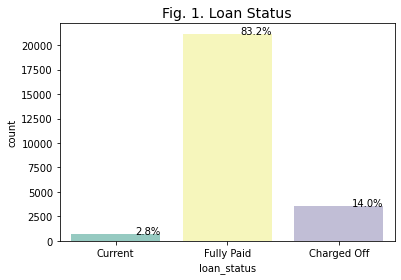

In [48]:
#proportion of loan status categories
total_records = float(len(df_final))
ax = sns.countplot(x="loan_status", data=df_final, palette="Set3")
plt.title('Fig. 1. Loan Status', fontsize=14)
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total_records)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='right')

##6.2 visualize distribution of object columns

<Figure size 432x288 with 0 Axes>

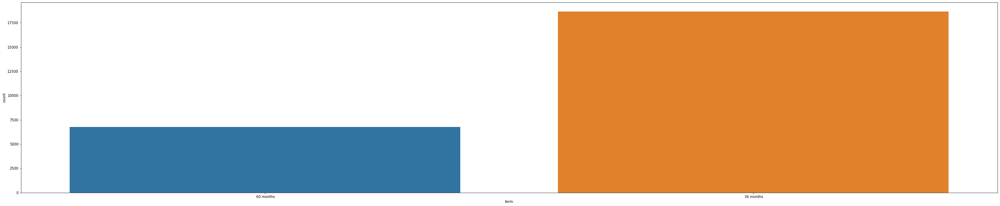

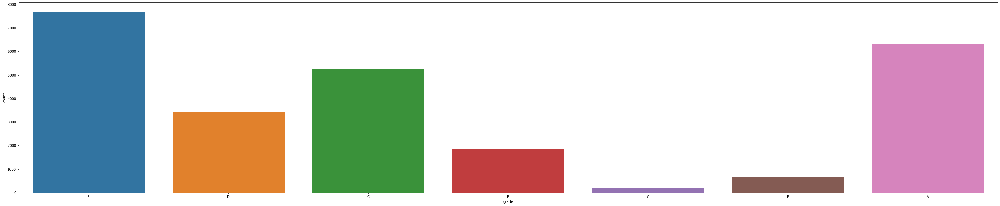

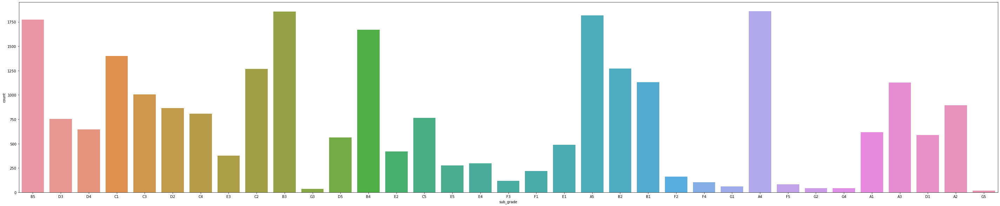

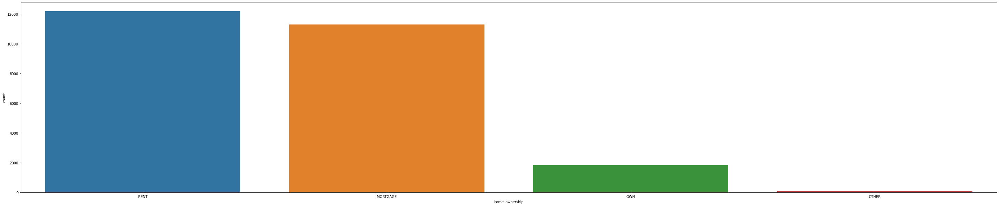

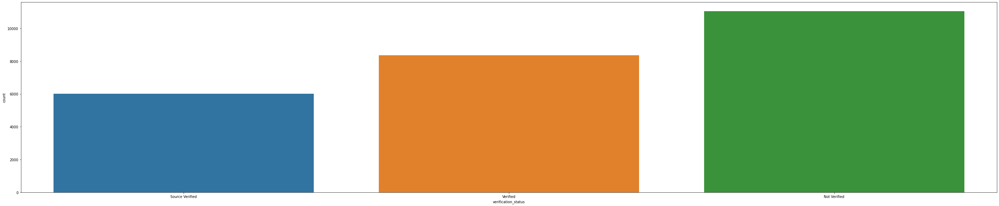

...

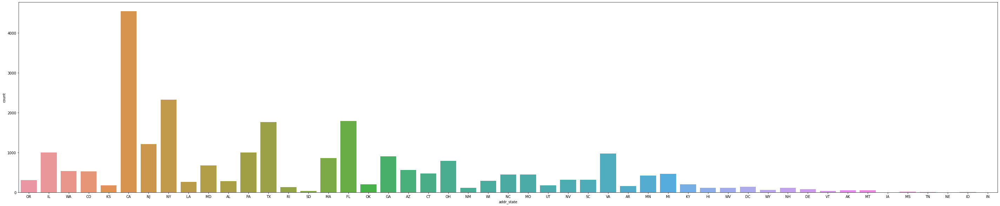

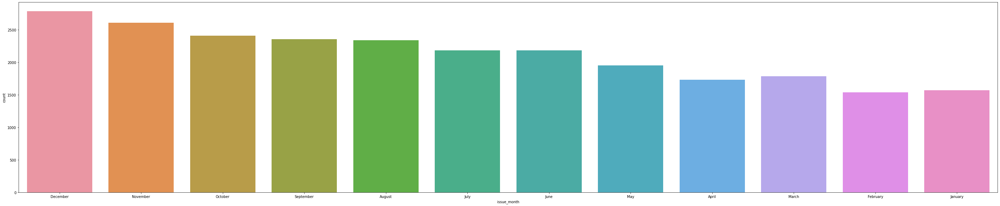

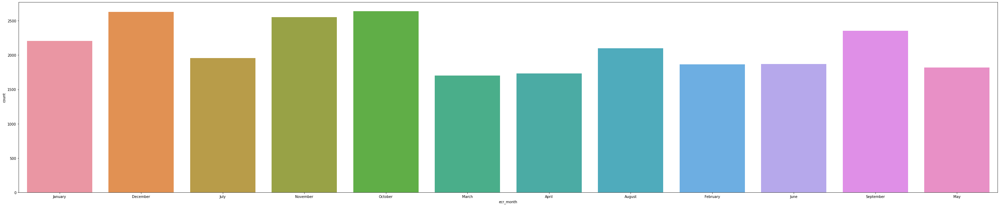

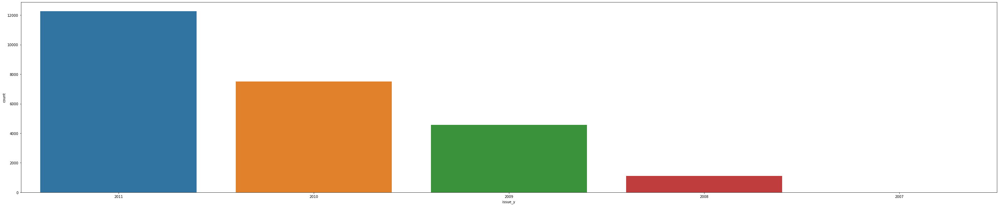

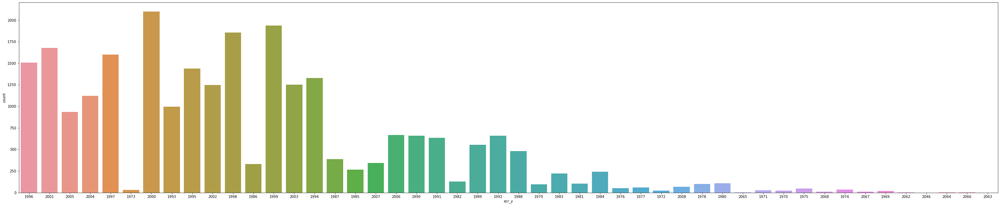

In [49]:
#create a list of variables for countplot
countplot_col = []
for col in df_final.columns:
  if col not in num_col:
    if df_final[col].nunique() < 50:
      countplot_col.append(col)
#create a dataframe having columns to be used for countplot
df_obj = df_final[countplot_col]
#create countplots
for i, col in enumerate(df_obj.columns):
    plt.figure(i)
    figsize = (50, 10)
    plt.figure(figsize=figsize)
    sns.countplot(x=col, data=df_obj)

**Majority of loans have been given to/ for:**

36 months
Lending club A and B grades
A4, A5, B3, B4, B5 subgrades
Persons living in rent or mortgage
unverified income source
Individuals living in California


**Other insights**
Most of the loans have been fully paid. Charged off loans are more than current 
loans.
Most of the loans were taken for debt consolidation, followed by credit card, small business, and home improvement.
Most of the loans data were from loans issued towards the winter and in 2011 and 2010.
Earliest credit line goes back to 1971.






##6.3 visualize distribution of numerical columns

In [50]:
# creating a list of numerical columns present in the subset 
num_col = df_final.select_dtypes(exclude=['object', 'datetime']).columns.to_list() 
len(num_col)

18

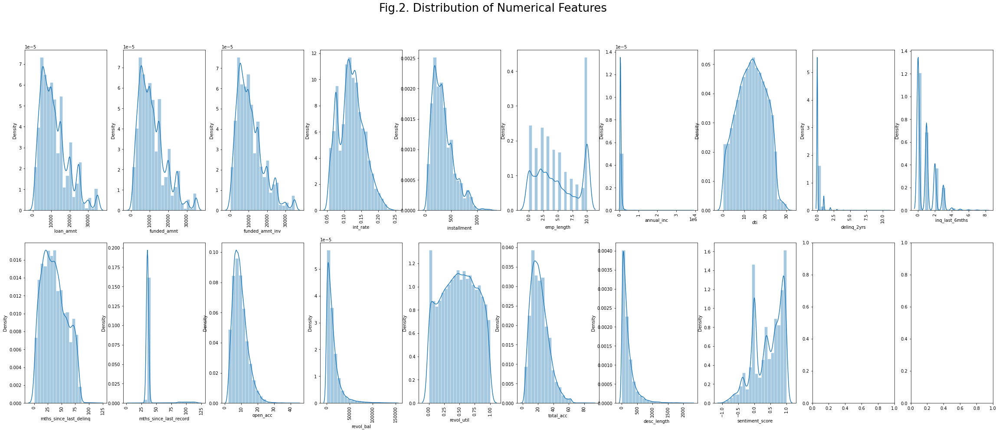

In [51]:
# Plotting the distribution of numerical columns in the dataframe
fig, ax = plt.subplots(2, 10, figsize=(40, 15))
fig.suptitle('Fig.2. Distribution of Numerical Features', fontsize=26)
sns.set_style("whitegrid")
for variable, subplot in zip(num_col, ax.flatten()):
    sns.distplot(df_final[variable], bins = 20, ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(90);

In [52]:
#measure skewness
skewness = df_final[num_col].skew(axis = 0).to_frame("Skewness")
skewness.style.applymap(lambda x: 'background-color : red' if x>1 or x<-1 else ('background-color : orange' if x>0.5 or x<-0.5 else ''))

,Skewness
loan_amnt,1.002278
funded_amnt,1.025131
funded_amnt_inv,1.049048
int_rate,0.282928
installment,1.063551
emp_length,0.248223
annual_inc,18.154302
dti,-0.050723
delinq_2yrs,4.911042
inq_last_6mths,1.405542


In [53]:
#create two lists based on skewness
num_col = df_final.select_dtypes(exclude=['object', 'datetime']).columns.to_list() 
num_col_1 = []
num_col_2 = []

for col in num_col:
  if df_final[col].skew()< -.5 or df_final[col].skew()> .5:
    num_col_1.append(col)
  else:
    num_col_2.append(col)

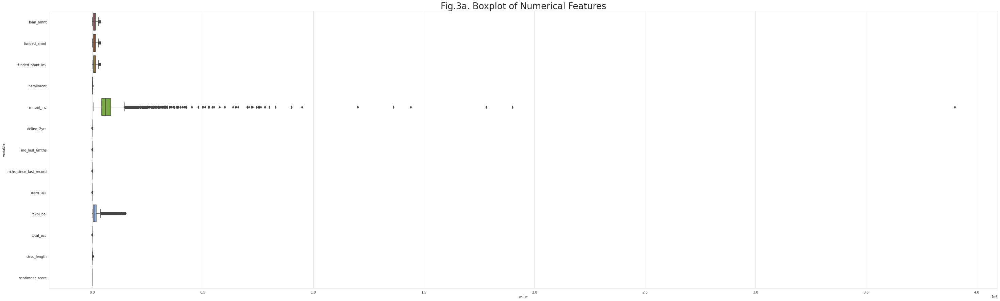

In [54]:
#create boxplot for numerical columns highly skewed
figsize = (50, 15)
plt.figure(figsize=figsize)

plt.title('Fig.3a. Boxplot of Numerical Features', fontsize=26)
df_quant = df_final[num_col_1]
df_melted = pd.melt(df_quant)
sns.boxplot(x='value', y='variable', orient="h", data=df_melted);

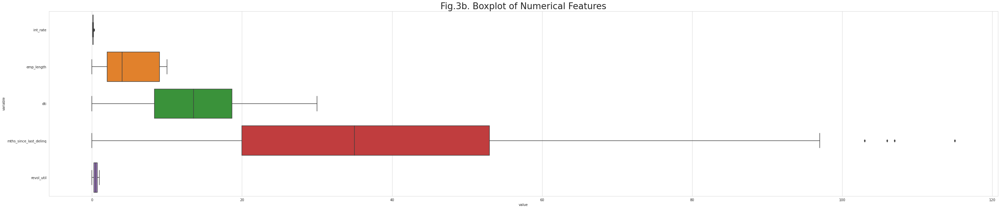

In [55]:
#create boxplot for numerical columns not highly skewed
figsize = (50, 10)
plt.figure(figsize=figsize)

plt.title('Fig.3b. Boxplot of Numerical Features', fontsize=26)
df_quant = df_final[num_col_2]
df_melted = pd.melt(df_quant)
sns.boxplot(x='value', y='variable', orient="h", data=df_melted);

Insights

Data descriptions for critical quantitative variables are provided before. Several variables including annual income, loan amount, interest rate are highly skewed.



##7.Bivariate Analysis and Multivariable Analysis

In [56]:
obj_col = df_final.select_dtypes(exclude=['int64', 'float64', 'datetime']).columns.to_list() 
len(obj_col)

15

In [57]:
df_obj = df_final[obj_col]

In [58]:
df_obj.columns

Index(['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status',
       'loan_status', 'purpose', 'zip_code', 'addr_state', 'pub_rec',
       'pub_rec_bankruptcies', 'issue_month', 'ecr_month', 'issue_y', 'ecr_y'],
      dtype='object')

<Figure size 432x288 with 0 Axes>

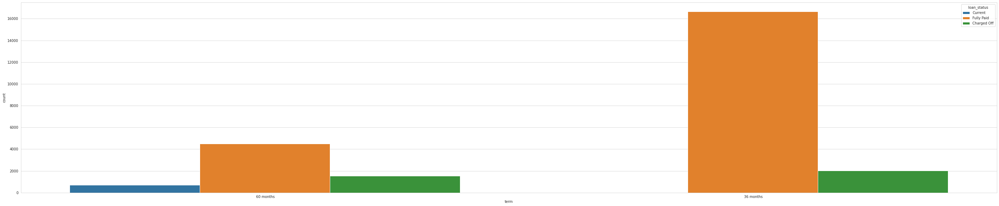

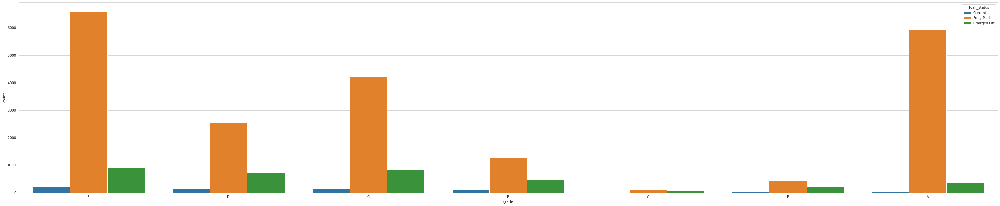

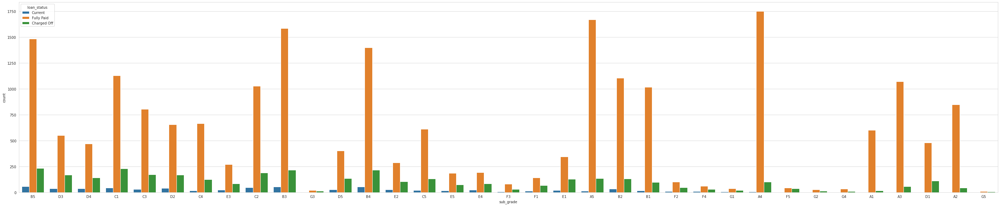

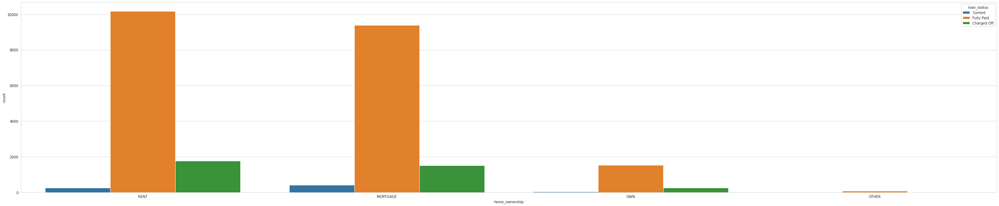

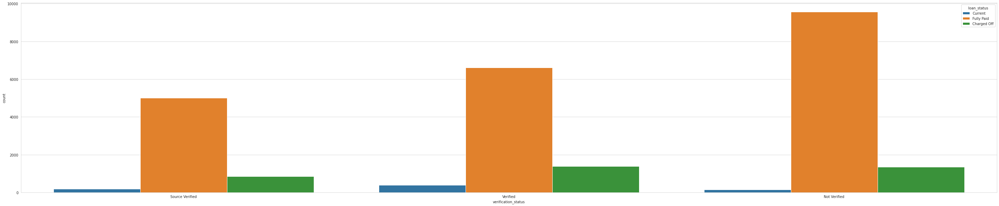

...

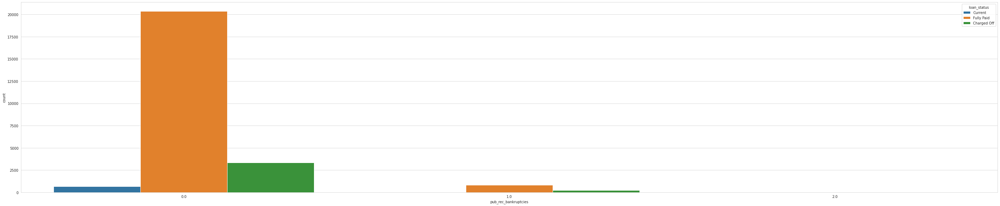

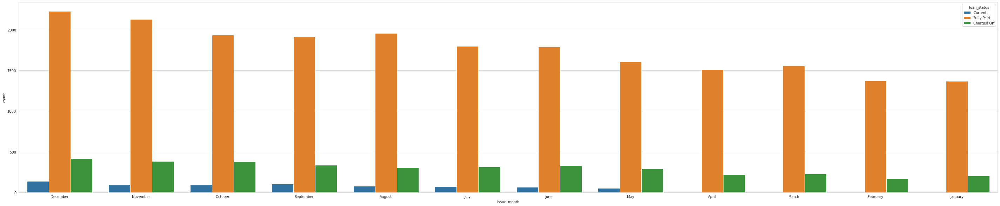

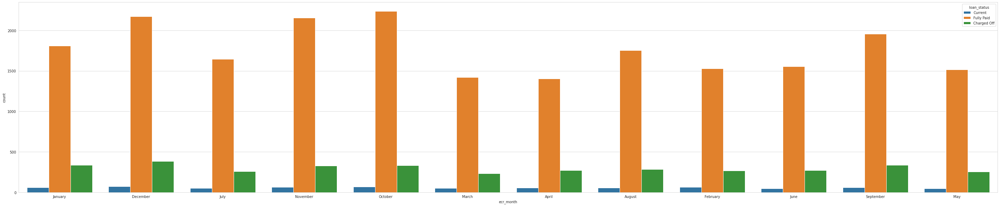

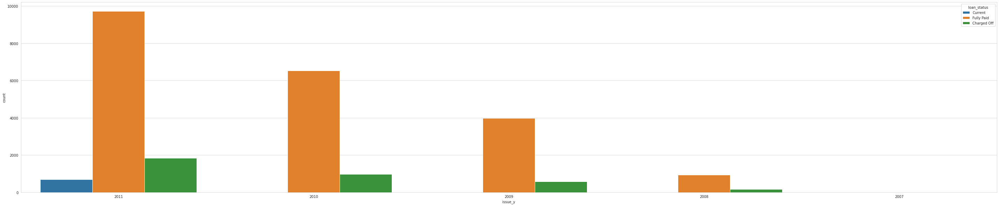

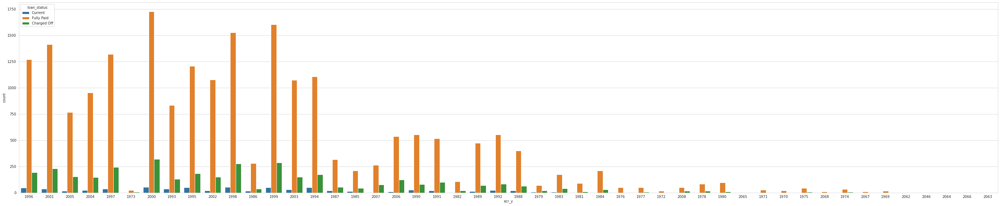

In [59]:
for i, col in enumerate(df_obj.columns):
    plt.figure(i)
    figsize = (50, 10)
    plt.figure(figsize=figsize)
    sns.countplot(x=col, hue="loan_status", data=df_obj)

Text(0.5, 1.0, 'Distribution of loan amount by loan status')

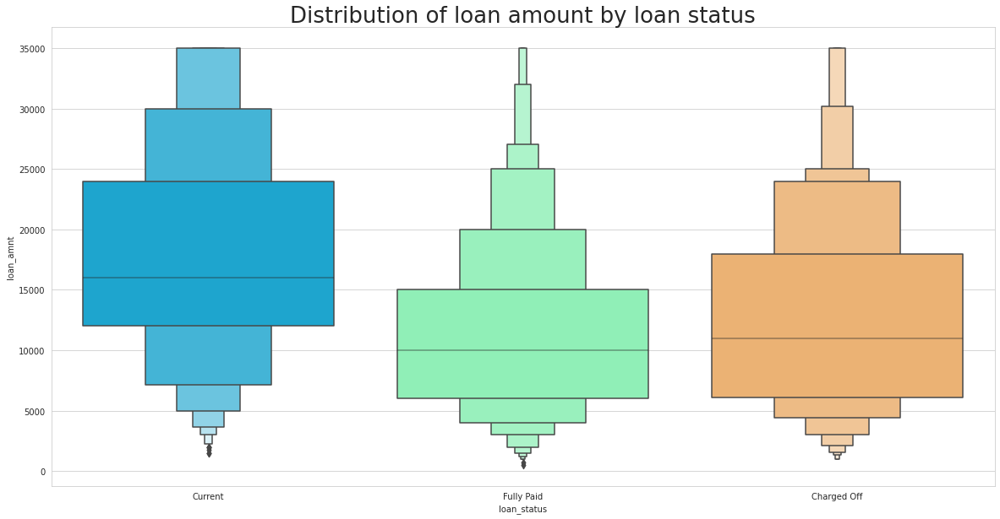

In [60]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='loan_amnt', data=df_final, palette='rainbow')
plt.title("Distribution of loan amount by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of interest rate by loan status')

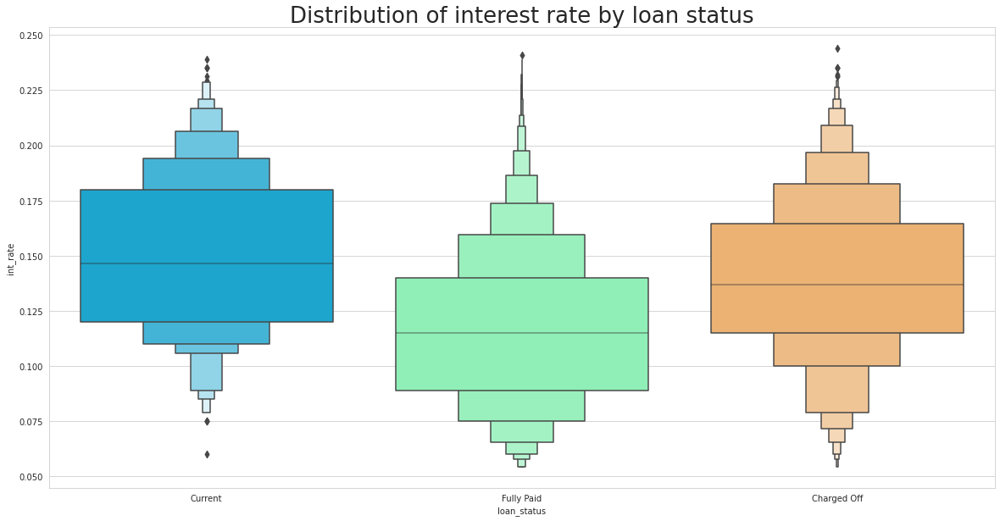

In [61]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='int_rate', data=df_final, palette='rainbow')
plt.title("Distribution of interest rate by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of installments by loan status')

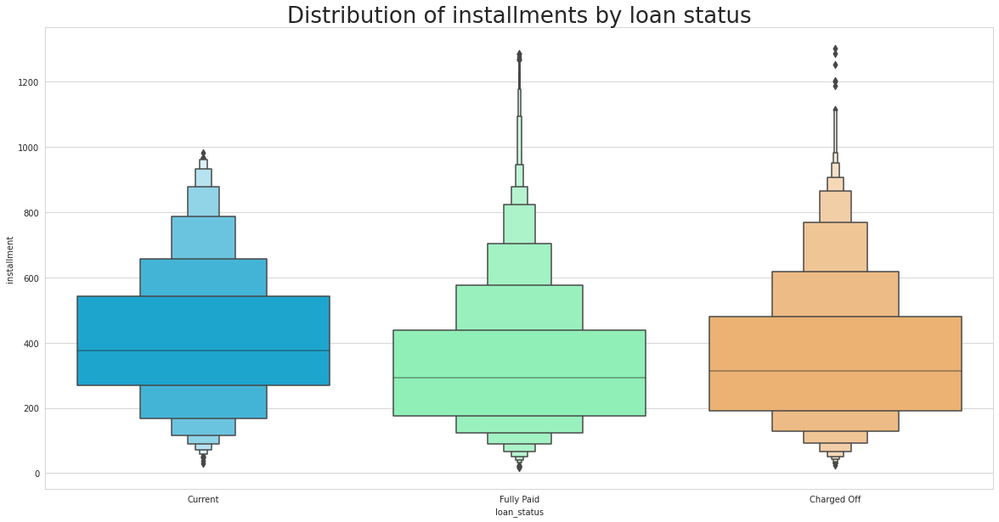

In [62]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='installment', data=df_final, palette='rainbow')
plt.title("Distribution of installments by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of employment length by loan status')

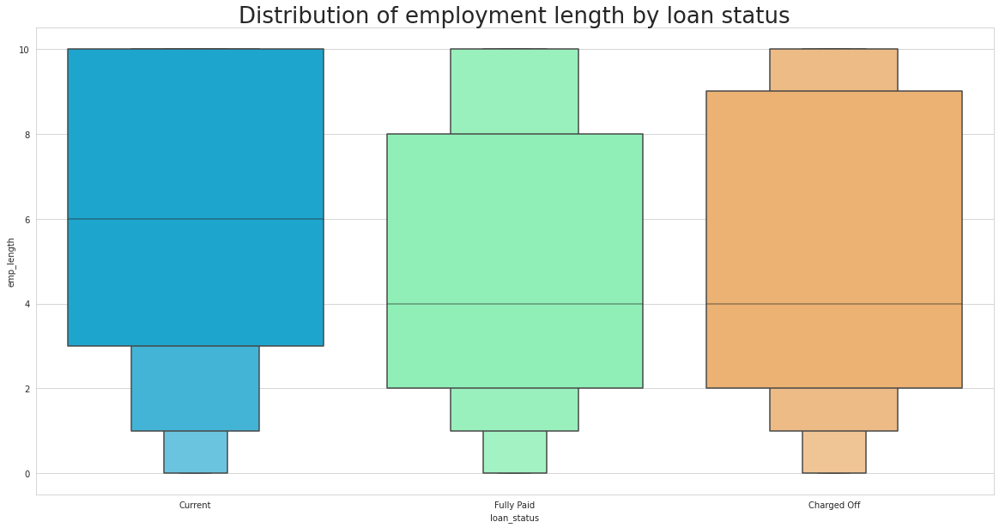

In [63]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='emp_length', data=df_final, palette='rainbow')
plt.title("Distribution of employment length by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of annual income by loan status')

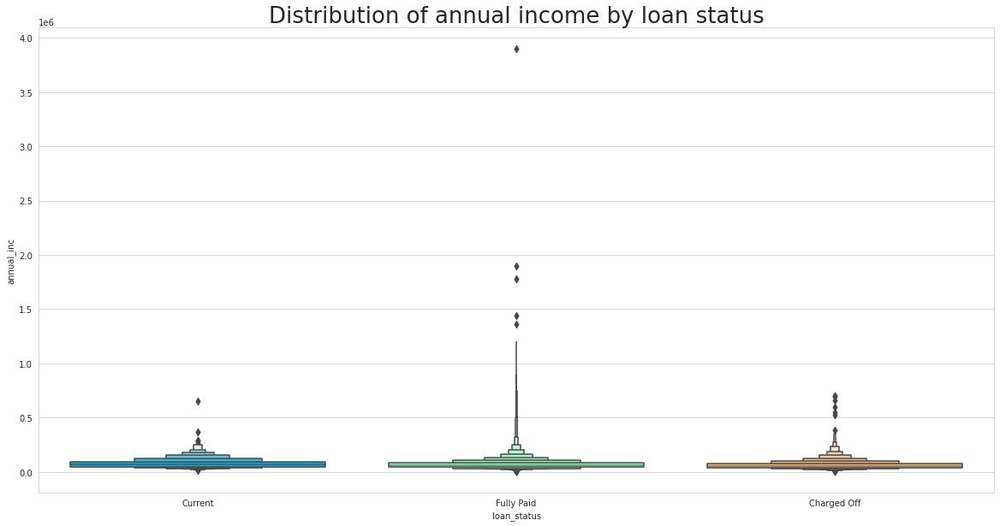

In [64]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='annual_inc', data=df_final, palette='rainbow')
plt.title("Distribution of annual income by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of DTI by loan status')

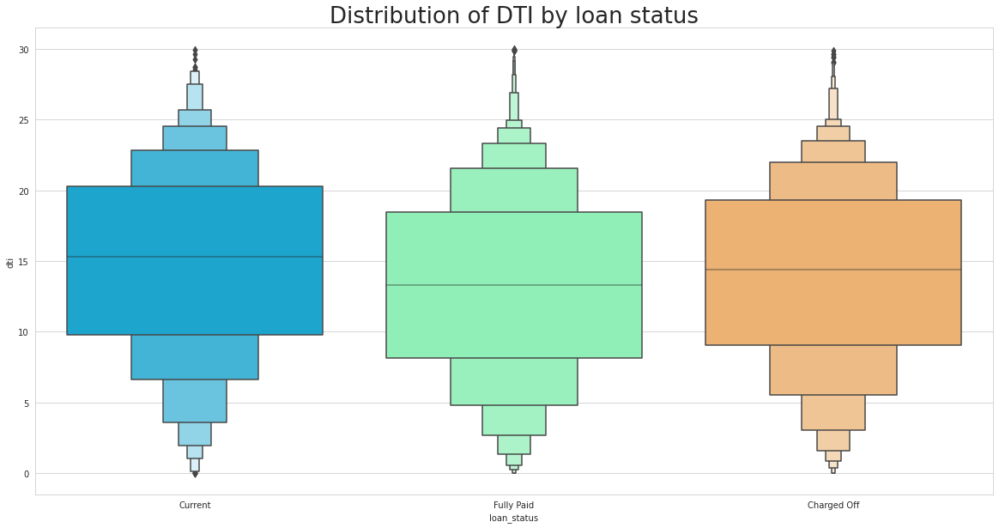

In [65]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='dti', data=df_final, palette='rainbow')
plt.title("Distribution of DTI by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of 2Y delinquency by loan status')

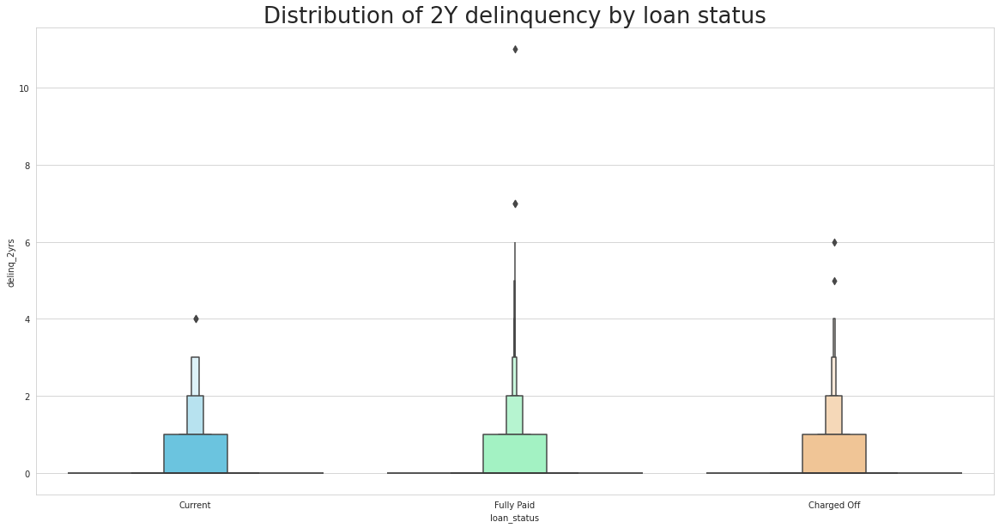

In [66]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='delinq_2yrs', data=df_final, palette='rainbow')
plt.title("Distribution of 2Y delinquency by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of number of enquiries in last 6 months by loan status')

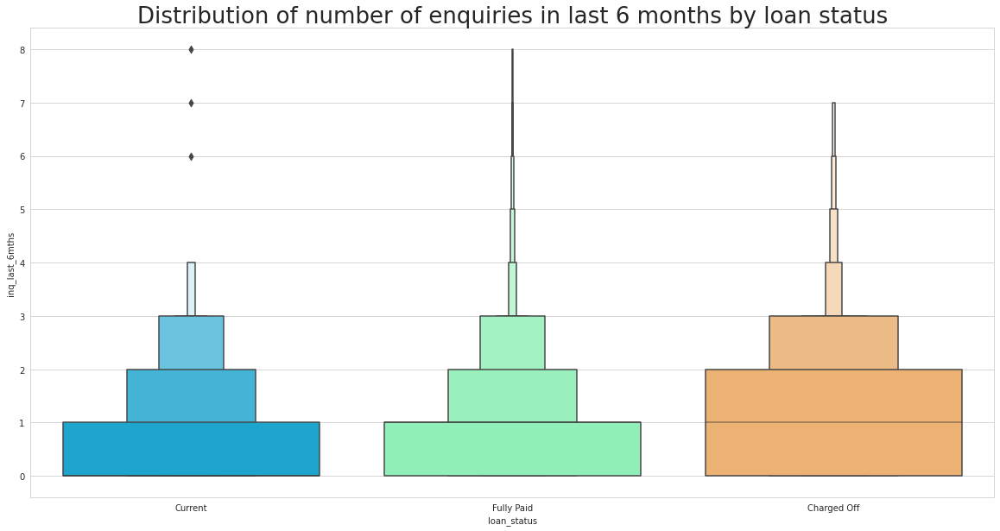

In [67]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='inq_last_6mths', data=df_final, palette='rainbow')
plt.title("Distribution of number of enquiries in last 6 months by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of months since last delinquency by loan status')

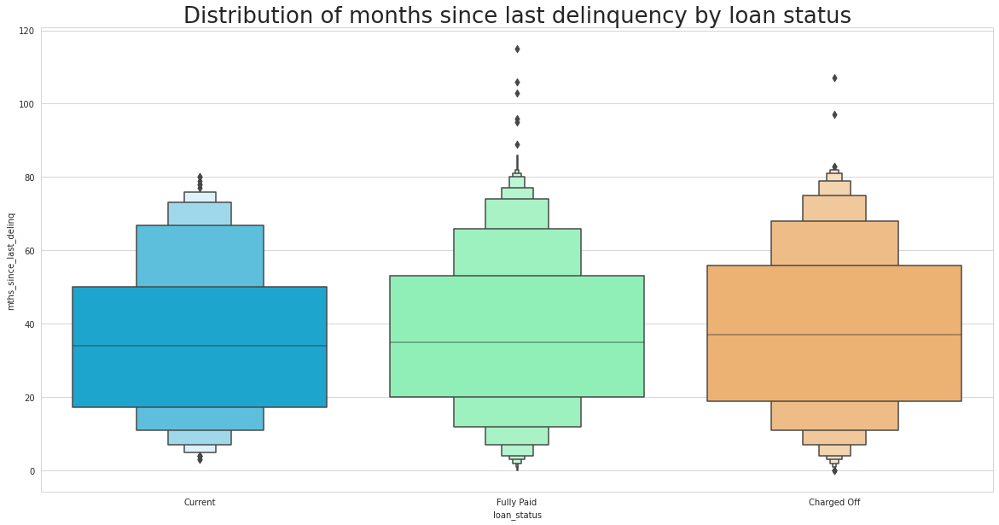

In [68]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='mths_since_last_delinq', data=df_final, palette='rainbow')
plt.title("Distribution of months since last delinquency by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of months since last record by loan status')

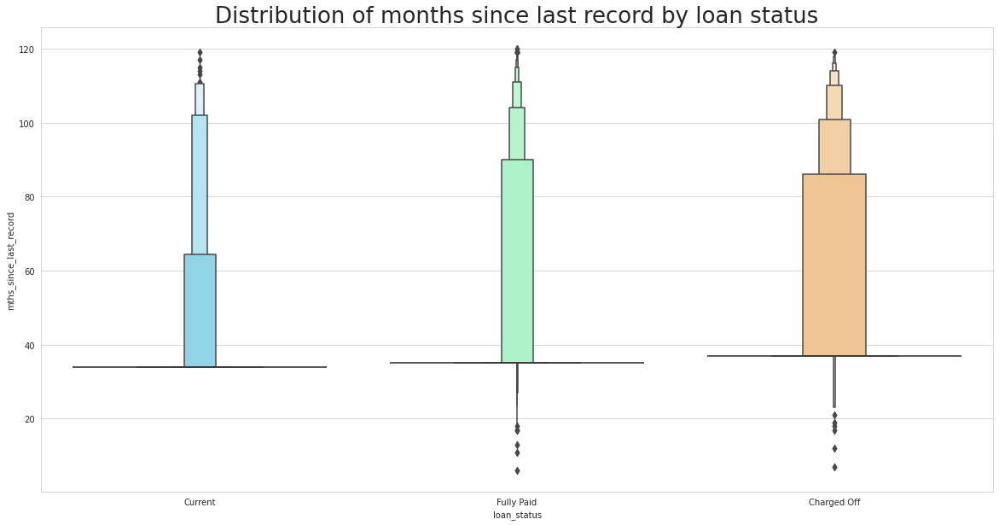

In [69]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='mths_since_last_record', data=df_final, palette='rainbow')
plt.title("Distribution of months since last record by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of open accounts by loan status')

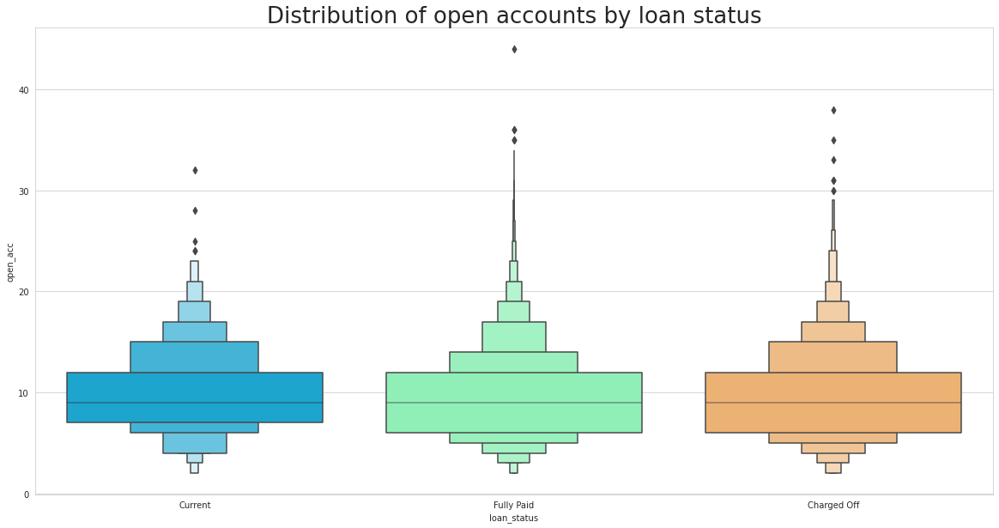

In [70]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='open_acc', data=df_final, palette='rainbow')
plt.title("Distribution of open accounts by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of revolving balance by loan status')

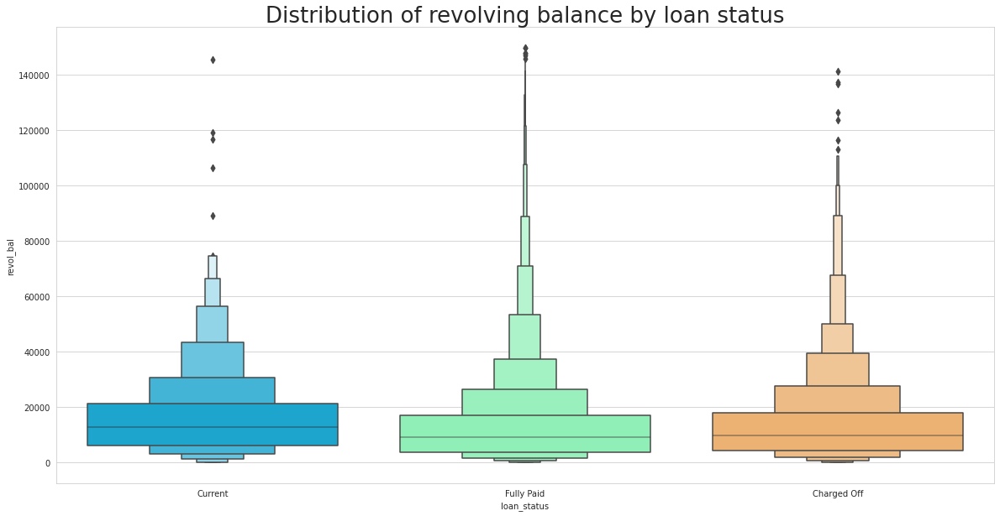

In [71]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='revol_bal', data=df_final, palette='rainbow')
plt.title("Distribution of revolving balance by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of revolving utilization by loan status')

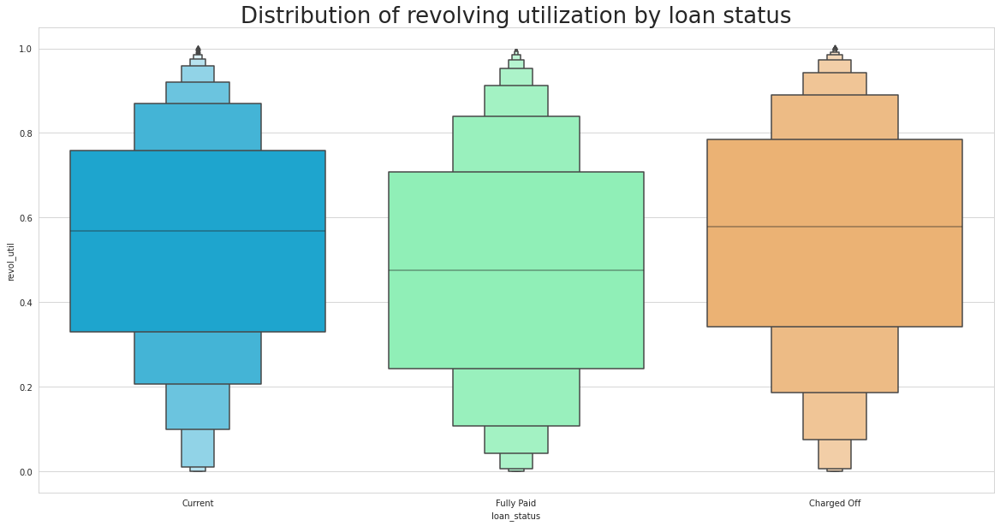

In [72]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='revol_util', data=df_final, palette='rainbow')
plt.title("Distribution of revolving utilization by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of total accounts by loan status')

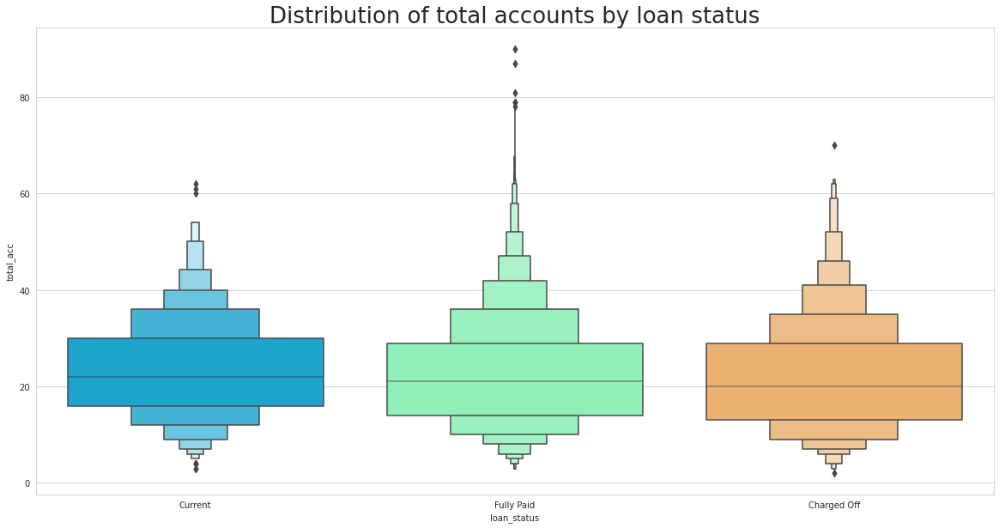

In [73]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='total_acc', data=df_final, palette='rainbow')
plt.title("Distribution of total accounts by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of loan description length by loan status')

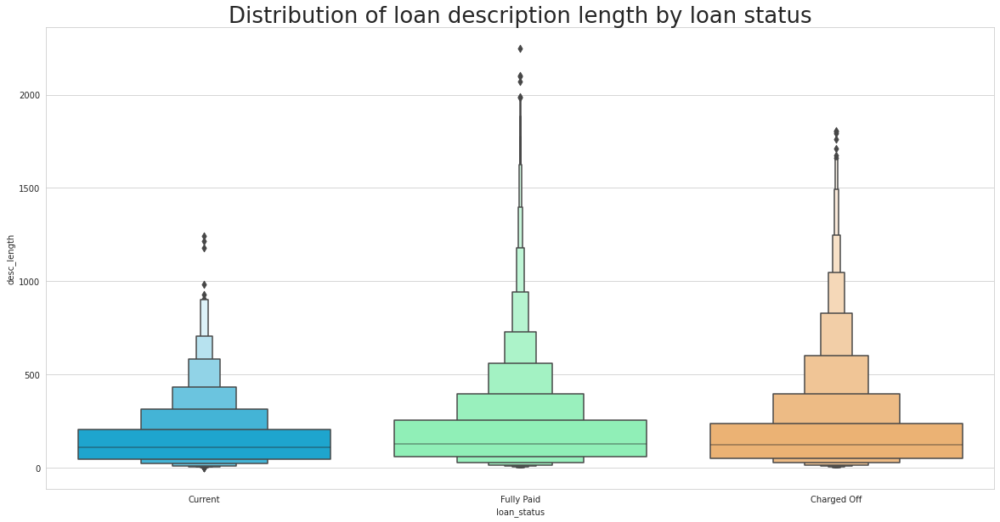

In [74]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='desc_length', data=df_final, palette='rainbow')
plt.title("Distribution of loan description length by loan status", fontsize=26)

Text(0.5, 1.0, 'Distribution of sentiment score by loan status')

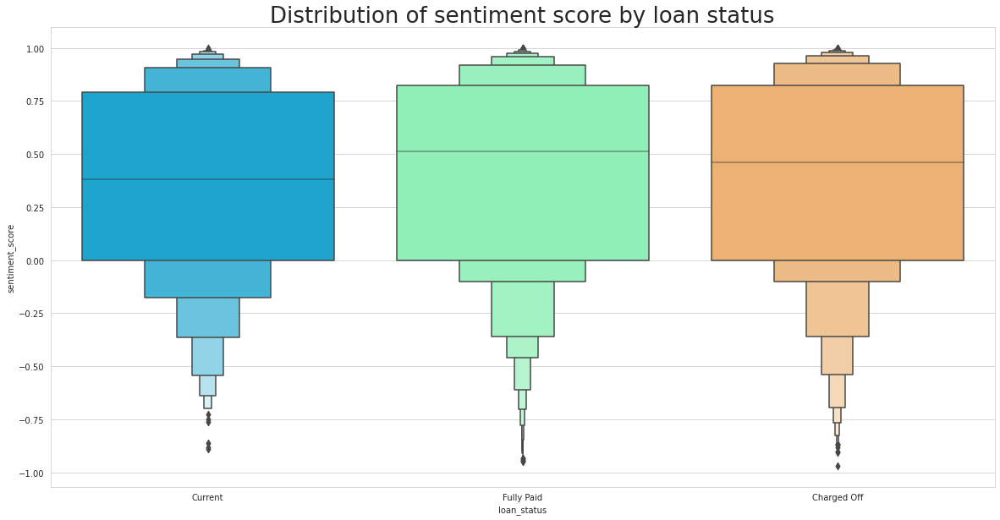

In [75]:
plt.figure(figsize=(20,10))
sns.boxenplot(x='loan_status', y='sentiment_score', data=df_final, palette='rainbow')
plt.title("Distribution of sentiment score by loan status", fontsize=26)

In [76]:
df_ts1 = (df_final.reset_index().groupby(['issue_d','loan_status'], as_index=False).count().rename(columns={'index':'ct'}))
df_ts2 = (df_final.reset_index().groupby(['earliest_cr_line','loan_status'], as_index=False).count().rename(columns={'index':'ct'}))

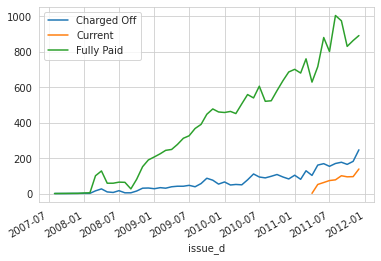

In [77]:
fig, ax = plt.subplots()
for key, data in df_ts1.groupby('loan_status'):
    data.plot(x='issue_d', y='ct', ax=ax, label=key)

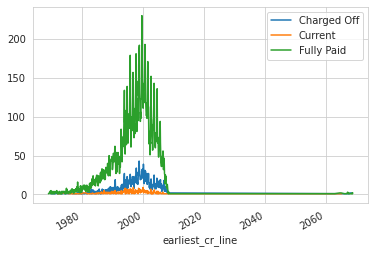

In [78]:
fig, ax = plt.subplots()
for key, data in df_ts2.groupby('loan_status'):
    data.plot(x='earliest_cr_line', y='ct', ax=ax, label=key)

**Insights**

Chances of charged off loans are apparently higher with:

1. 60 month tenure
2. Loan grade E and F
3. Rent more than mortgage
4. Source verified income
5. 1 derogatory public record
6. More recent ECRs
7. Higher interest rates
8. More enquiries in last 6 months
9. Lesser description sentiment score
10. More revolving utilization 
11. More DTI




##8.Complex multivariable relationships

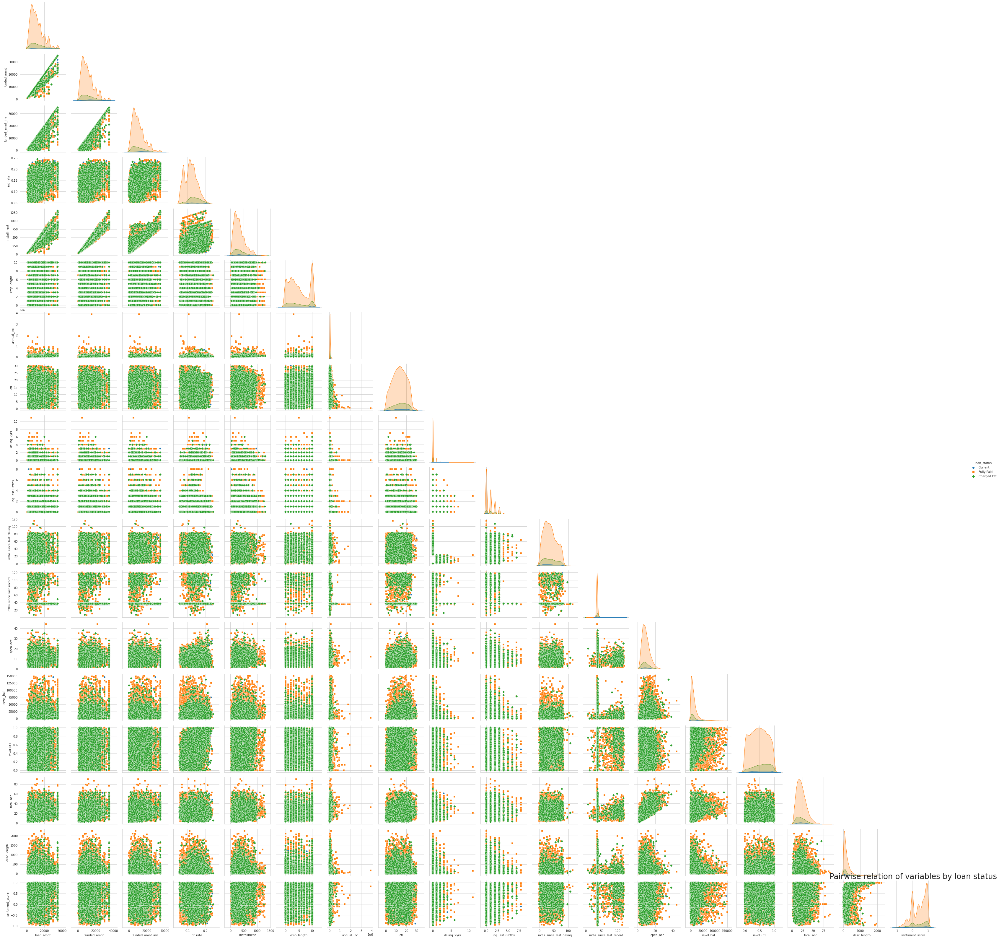

In [79]:
sns.pairplot(df_final, hue="loan_status", markers=["o", "s", "D"], corner= True)
plt.title("Pairwise relation of variables by loan status", fontsize=26);

In [80]:
fig = px.box(df_final, x="annual_inc", y="loan_amnt", color="loan_status",
             notched=True, 
             title="How loan amount and annual income impacts loan status",
             hover_data=["issue_month"] 
            )
fig.show()

In [81]:
fig = px.box(df_final, x="int_rate", y="annual_inc", color="loan_status",
             notched=True, 
             title="How annual income and interest rates impacts loan status",
             hover_data=["issue_month"] 
            )
fig.show()

In [82]:
fig = px.box(df_final, x="revol_bal", y="inq_last_6mths", color="loan_status",
             notched=True, 
             title="How loan enquiries and revolving balance impact loan status",
             hover_data=["issue_month"] 
            )
fig.show()

In [83]:
fig = px.box(df_final, x="total_acc", y="open_acc", color="loan_status",
             notched=True, 
             title="How total vs open accounts impact loan status",
             hover_data=["issue_month"] 
            )
fig.show()

In [84]:
fig = px.box(df_final, x="sentiment_score", y="desc_length", color="loan_status",
             notched=True, 
             title="How description length and its sentiment reflects the loan status risk",
             hover_data=["issue_month"] 
            )
fig.show()

In [85]:
fig = px.treemap(df_final, path=[px.Constant("Loan Status"), 'loan_status', 'issue_y', 'term', 'emp_length'], values='loan_amnt',
                  color='annual_inc', hover_data=['addr_state'],
                  color_continuous_scale='RdBu',
                  color_continuous_midpoint=np.average(df_final['annual_inc'], weights=df_final['loan_amnt']))
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

1. Lower annual income irrespective of loan amount, but with higher interest rates have greater frequency of charge off.
2. More inquiries in last 6 months with less revolving balance is more likely to get into charge off.
3. The extreme positive of sentiment score of description along with large description may result in more likely charge off. 
4. Charge off is more with higher number of total accounts when open accounts are more.
5. Income less than 80K along with higher employment length and loan tenure of 60 months are more likely to charge off.
